In [28]:
print(torch.version)

<module 'torch.version' from 'C:\\Users\\sunsu\\Miniconda3\\envs\\torch\\lib\\site-packages\\torch\\version.py'>


In [99]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Generator Block
Creating generator neural network

**Linear Transformation(To map another block)** 

**Batch Normalization(Stabilization)**

**Non Linear Activation (Relu)**

In [100]:
def generator_block(input_dim,output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
    )

In [101]:
class Generator(nn.Module):
    def __init__(self,z_dim = 10, im_dim =784, hidden_dim = 128):
        super(Generator,self).__init__()
        self.gen = nn.Sequential(
            generator_block(z_dim, hidden_dim),
            generator_block(hidden_dim, hidden_dim * 2),
            generator_block(hidden_dim * 2, hidden_dim * 4),
            generator_block(hidden_dim * 4, hidden_dim * 8),
            nn.Linear(hidden_dim * 8 ,im_dim),
            nn.Sigmoid()
        )
    def forward(self,noise):
        return self.gen(noise)
    def get_gen(self):
        return self.gen

In [102]:
def get_noise(n_samples,z_dim, device = device):
    return torch.randn(n_samples,z_dim,device = device)

In [103]:
def discriminator_block(input_dim,output_dim):
    return nn.Sequential(
        nn.Linear(input_dim,output_dim),
        nn.LeakyReLU(negative_slope =0.2, inplace = True)
    )

In [104]:
class Discriminator(nn.Module):
    def __init__(self,im_dim = 784 , hidden_dim = 128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            discriminator_block(im_dim, hidden_dim * 4),
            discriminator_block(hidden_dim * 4, hidden_dim * 2),
            discriminator_block(hidden_dim * 2, hidden_dim),
            nn.Linear(hidden_dim, 1)
        )
    def forward(self,image):
        return self.disc(image)
    def get_disc(self):
        return self.disc
        

In [105]:
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

In [106]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [107]:
def get_disc_loss(gen,disc,criterion,real,num_images,z_dim, device):
    noise = get_noise(num_images, z_dim, device)
    fake_loss = criterion(disc(gen(noise).detach()), torch.zeros(num_images, 1).to(device))
    real_loss = criterion(disc(real), torch.ones(num_images, 1).to(device))
    disc_loss = (fake_loss + real_loss) / 2
    return disc_loss

In [108]:
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    noise = get_noise(num_images, z_dim, device)
    gen_loss = criterion(disc(gen(noise)), torch.ones(num_images, 1).to(device))
    return gen_loss

Step 500: Generator loss: 1.3866708533763874, discriminator loss: 0.41940878039598467


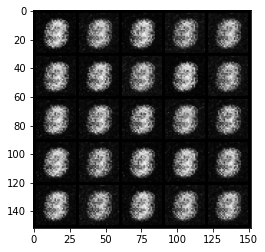

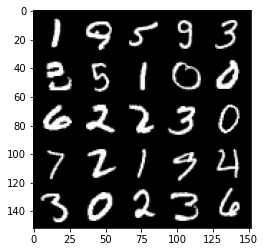

Step 1000: Generator loss: 1.6655366156101254, discriminator loss: 0.3019674933254722


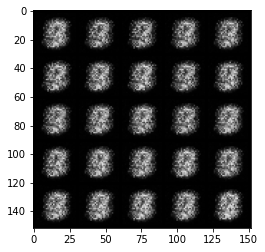

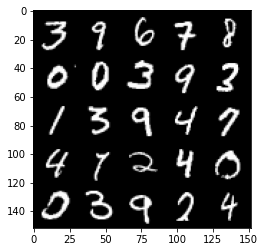

Step 1500: Generator loss: 1.956172301769258, discriminator loss: 0.1755485829114913


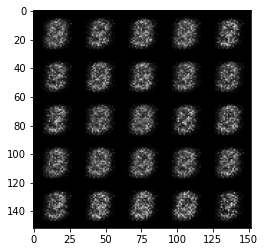

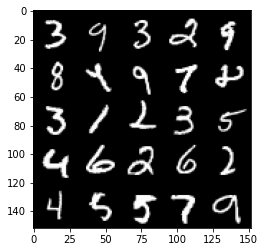

Step 2000: Generator loss: 1.7544726560115829, discriminator loss: 0.1973077189028263


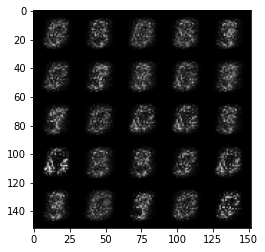

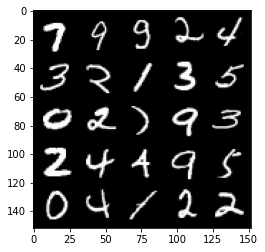

Step 2500: Generator loss: 1.7153118171691886, discriminator loss: 0.1987037809193135


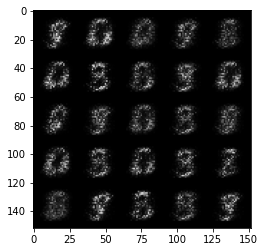

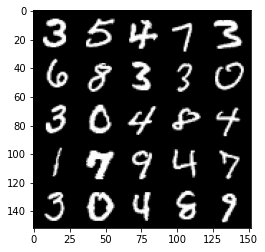

Step 3000: Generator loss: 1.9567499043941503, discriminator loss: 0.16021022847294816


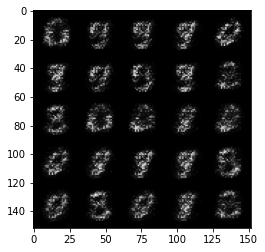

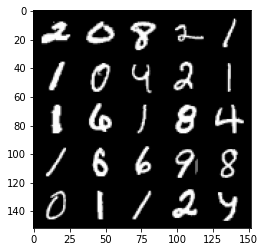

Step 3500: Generator loss: 2.387376680850982, discriminator loss: 0.12758219620585443


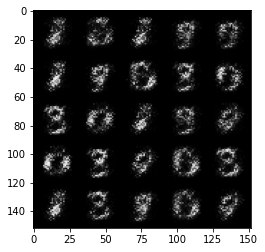

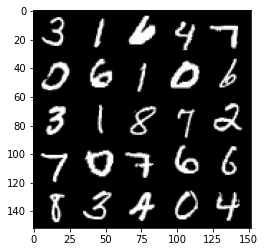

Step 4000: Generator loss: 2.7332407388687137, discriminator loss: 0.10985370281338691


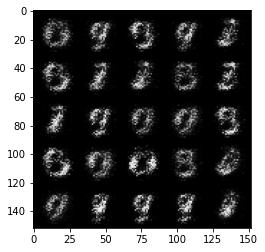

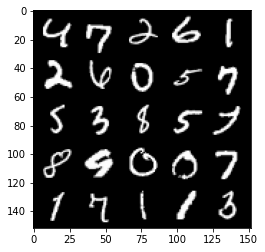

Step 4500: Generator loss: 3.153580831527708, discriminator loss: 0.08941705188900224


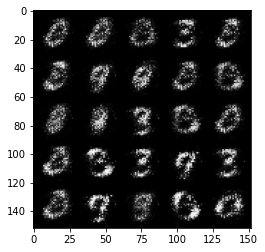

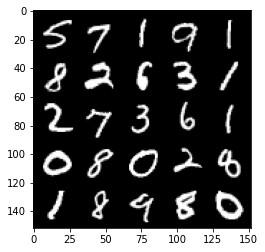

Step 5000: Generator loss: 3.543335270404815, discriminator loss: 0.07612487338483334


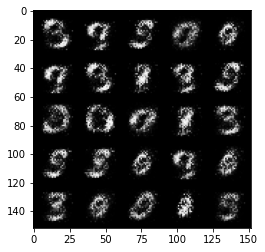

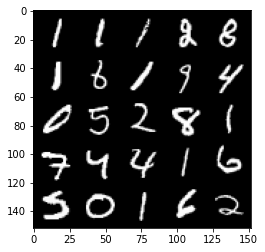

Step 5500: Generator loss: 3.582212630748746, discriminator loss: 0.0829657694101333


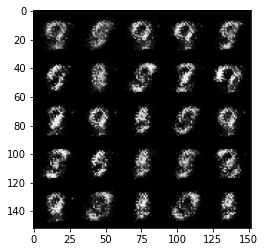

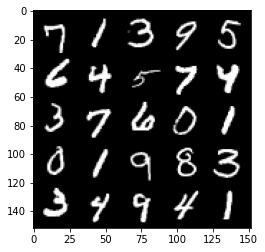

Step 6000: Generator loss: 3.6905417299270638, discriminator loss: 0.07689826378226289


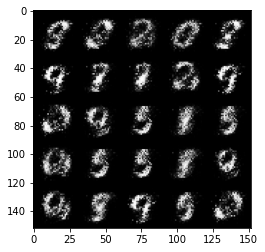

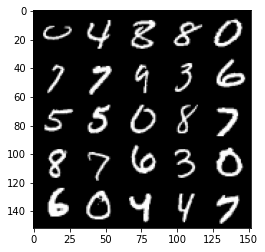

Step 6500: Generator loss: 3.877607996940615, discriminator loss: 0.060377051495015634


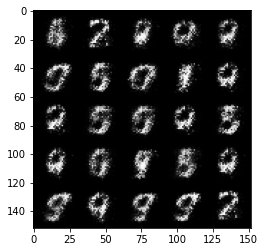

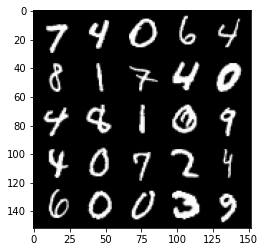

Step 7000: Generator loss: 3.880032052993776, discriminator loss: 0.05235450780764222


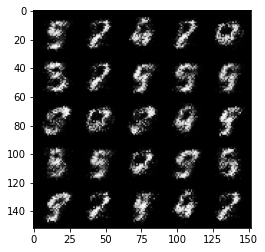

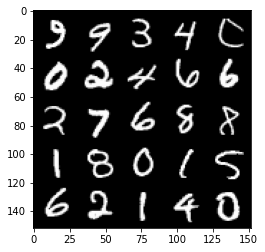

Step 7500: Generator loss: 4.060003634929658, discriminator loss: 0.047421255856752366


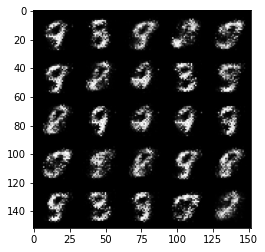

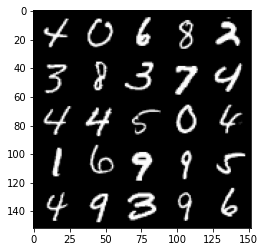

Step 8000: Generator loss: 4.16581738090515, discriminator loss: 0.049107016794383535


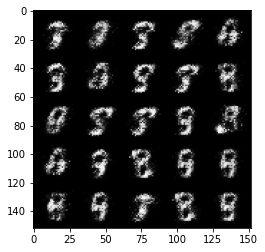

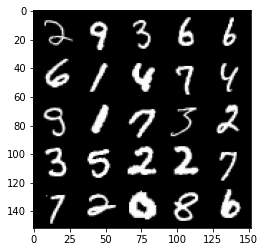

Step 8500: Generator loss: 3.9803288722038284, discriminator loss: 0.057226856209337644


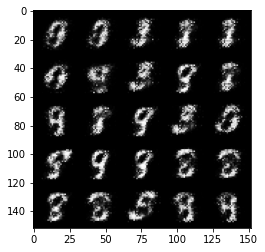

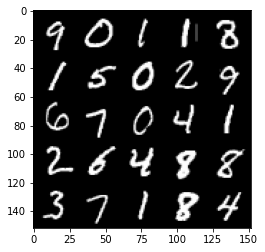

Step 9000: Generator loss: 3.9935362477302543, discriminator loss: 0.06266041724383833


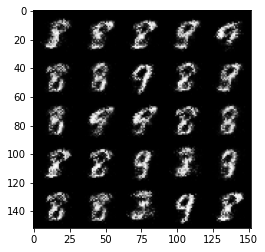

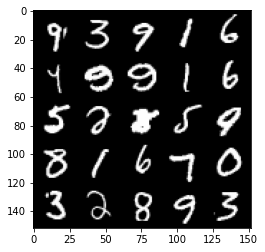

Step 9500: Generator loss: 3.847616174697873, discriminator loss: 0.0629270973056555


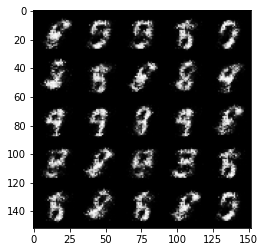

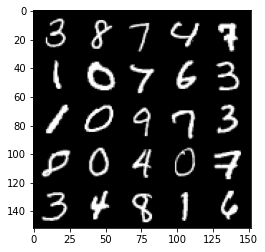

Step 10000: Generator loss: 3.8368981156349165, discriminator loss: 0.07015579595416786


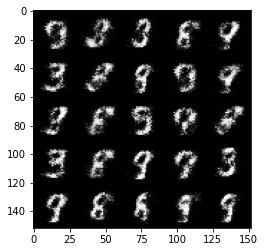

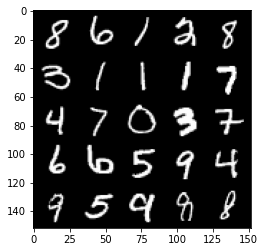

Step 10500: Generator loss: 3.9022699255943314, discriminator loss: 0.06736371656879786


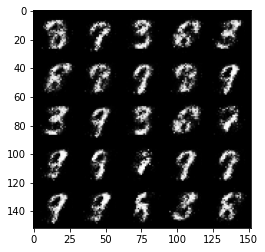

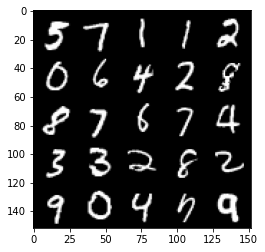

Step 11000: Generator loss: 3.916490554809568, discriminator loss: 0.06196207486093047


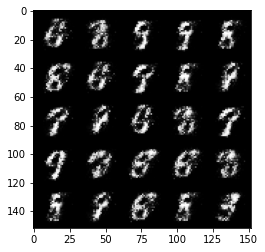

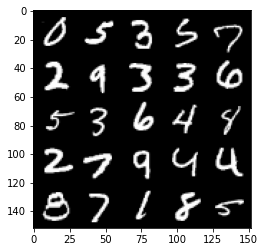

Step 11500: Generator loss: 3.9136793346405025, discriminator loss: 0.06961917065829036


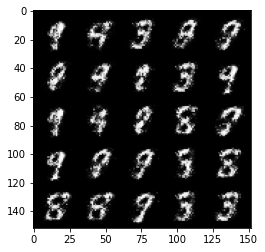

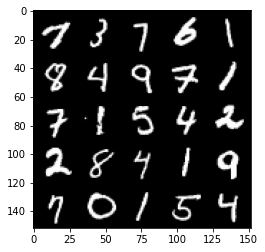

Step 12000: Generator loss: 3.800778451919557, discriminator loss: 0.08099387636780739


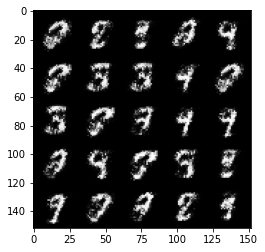

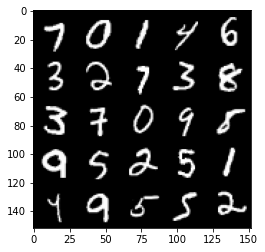

Step 12500: Generator loss: 3.9394946174621603, discriminator loss: 0.0728985867649317


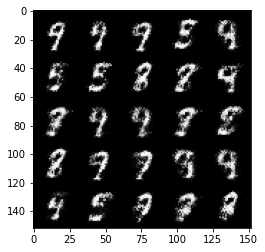

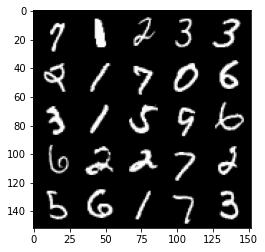

Step 13000: Generator loss: 3.880279956340794, discriminator loss: 0.07676961988210684


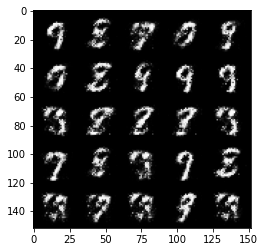

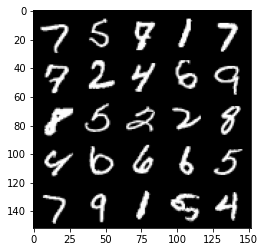

Step 13500: Generator loss: 3.9888100647926334, discriminator loss: 0.08683474314957858


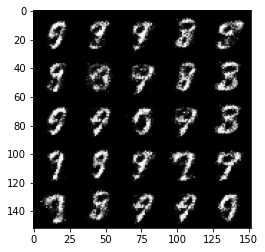

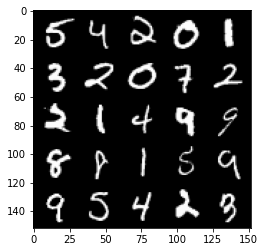

Step 14000: Generator loss: 3.684614194869996, discriminator loss: 0.10283943320810798


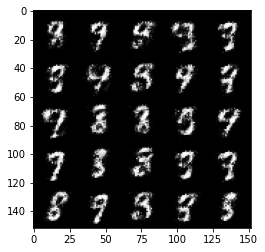

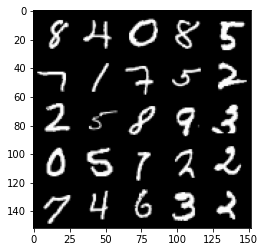

Step 14500: Generator loss: 3.6083334851264923, discriminator loss: 0.09978586100041871


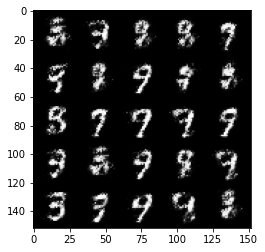

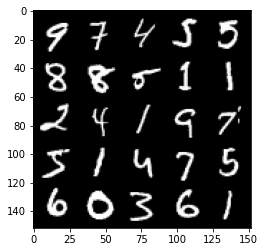

Step 15000: Generator loss: 3.6452337021827668, discriminator loss: 0.10211662253737444


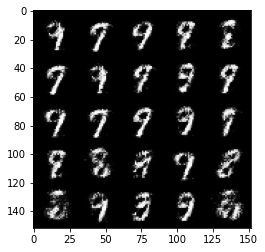

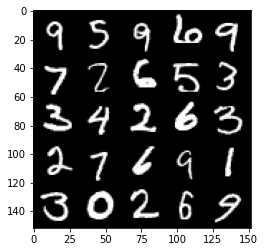

Step 15500: Generator loss: 3.5450858030319212, discriminator loss: 0.11244617760926472


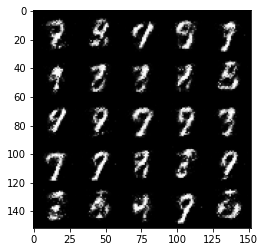

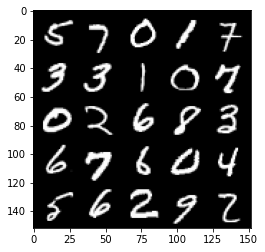

Step 16000: Generator loss: 3.647603568077086, discriminator loss: 0.12130995094776158


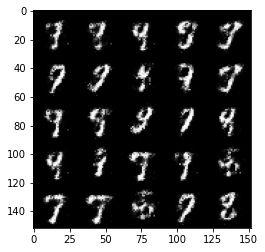

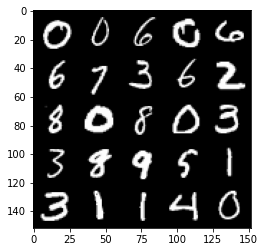

Step 16500: Generator loss: 3.57887577724457, discriminator loss: 0.13009694005548952


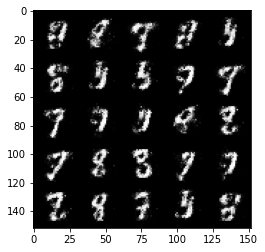

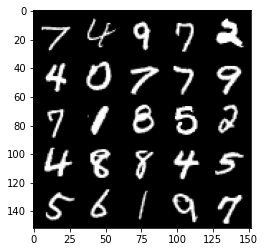

Step 17000: Generator loss: 3.5305607943534834, discriminator loss: 0.13359673768281927


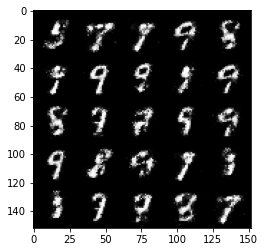

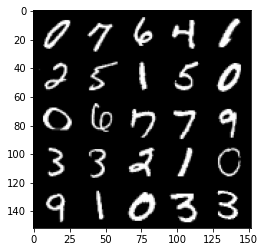

Step 17500: Generator loss: 3.5649459695816015, discriminator loss: 0.12636965867877


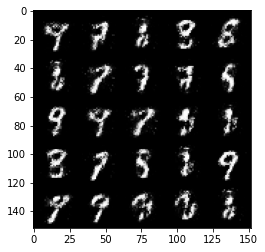

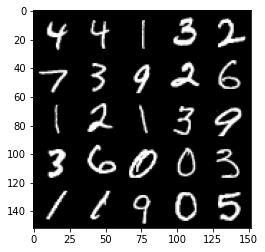

Step 18000: Generator loss: 3.4933641476631117, discriminator loss: 0.1251536292135717


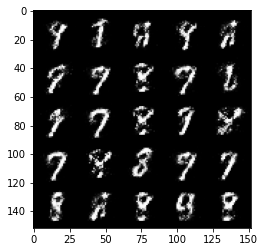

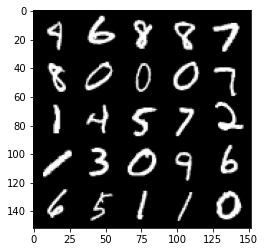

Step 18500: Generator loss: 3.3723981537818903, discriminator loss: 0.13952730734646326


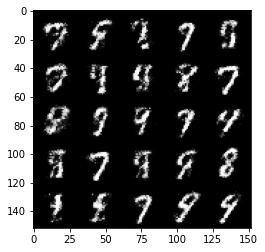

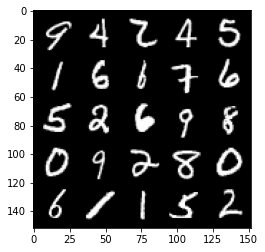

Step 19000: Generator loss: 3.1548013100624104, discriminator loss: 0.15584980069100865


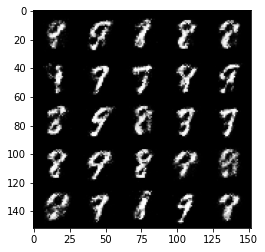

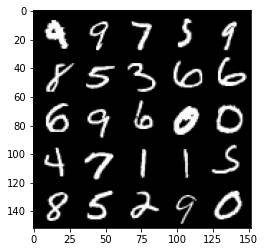

Step 19500: Generator loss: 3.241425997734068, discriminator loss: 0.13960328671336175


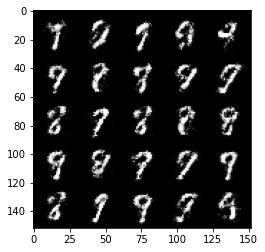

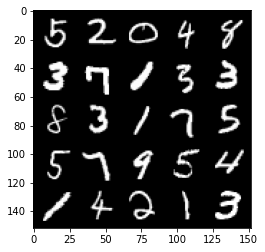

Step 20000: Generator loss: 3.292972863674166, discriminator loss: 0.142118484944105


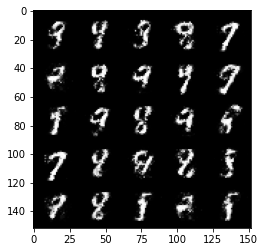

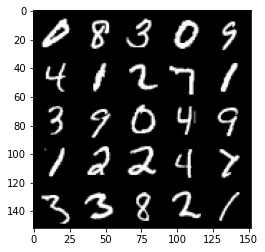

Step 20500: Generator loss: 3.1757522168159515, discriminator loss: 0.1710447049587963


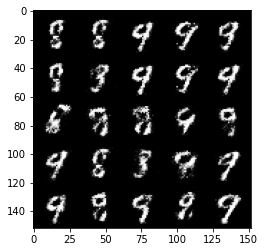

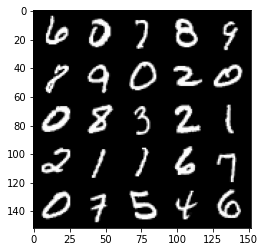

Step 21000: Generator loss: 3.168122274398807, discriminator loss: 0.15003580105304715


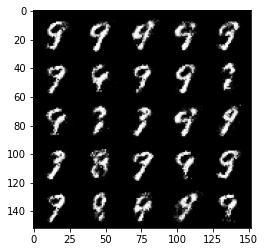

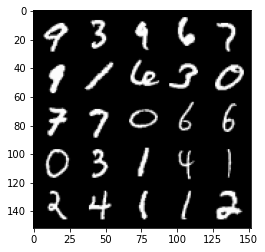

Step 21500: Generator loss: 3.221969014167785, discriminator loss: 0.14752028426527966


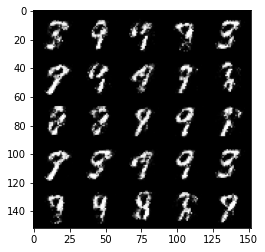

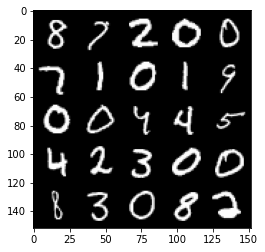

Step 22000: Generator loss: 3.1820550651550303, discriminator loss: 0.16819944250583646


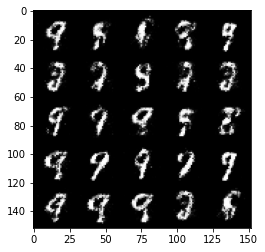

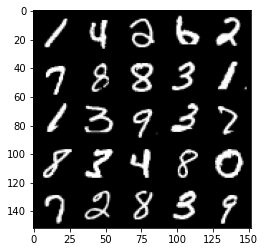

Step 22500: Generator loss: 2.9939996609687807, discriminator loss: 0.18693704925477522


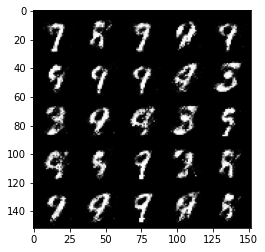

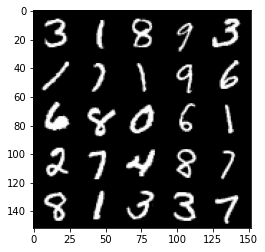

Step 23000: Generator loss: 3.106378571033481, discriminator loss: 0.1690466383993625


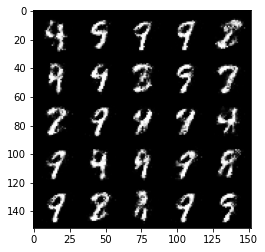

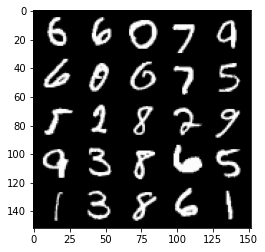

Step 23500: Generator loss: 2.9918737769126893, discriminator loss: 0.18268822179734692


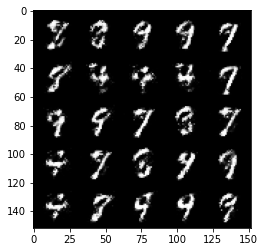

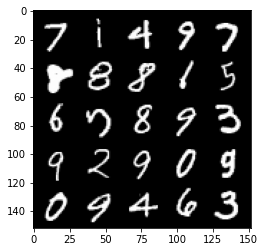

Step 24000: Generator loss: 3.026338294506076, discriminator loss: 0.1878789700567723


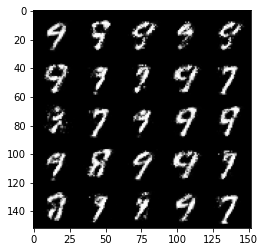

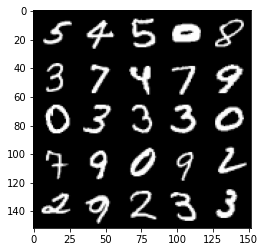

Step 24500: Generator loss: 3.064453290462495, discriminator loss: 0.17375556187331687


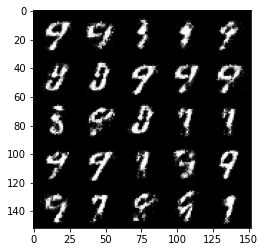

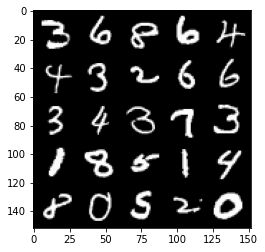

Step 25000: Generator loss: 2.890489166736605, discriminator loss: 0.19876115579903134


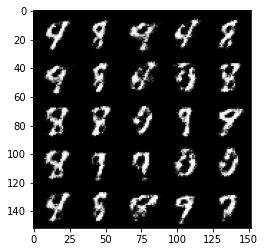

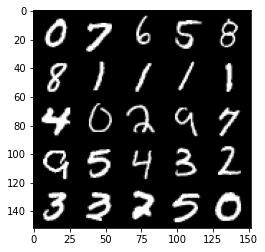

Step 25500: Generator loss: 3.0490194435119635, discriminator loss: 0.18250060547888278


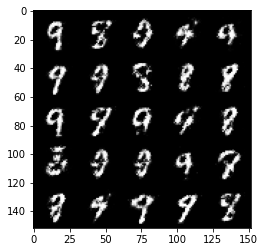

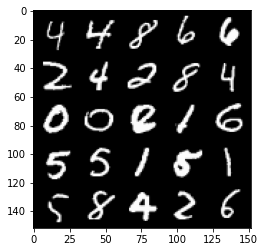

Step 26000: Generator loss: 2.7934142336845404, discriminator loss: 0.19905085271596928


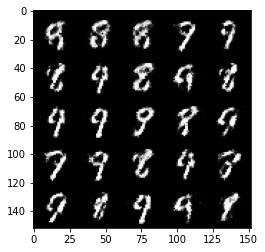

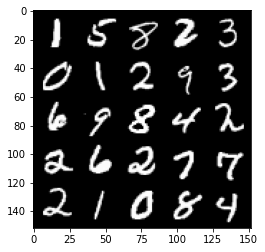

Step 26500: Generator loss: 3.036927920341493, discriminator loss: 0.18424148620665068


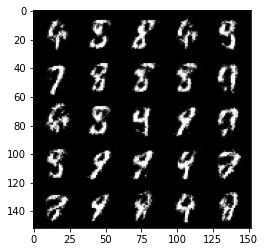

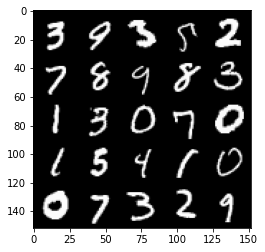

Step 27000: Generator loss: 3.010866910934449, discriminator loss: 0.18848627726733688


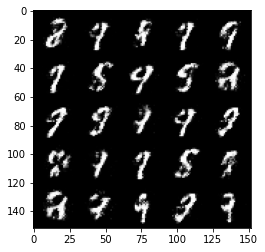

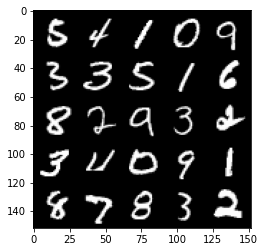

Step 27500: Generator loss: 2.838309023380277, discriminator loss: 0.21243887262046326


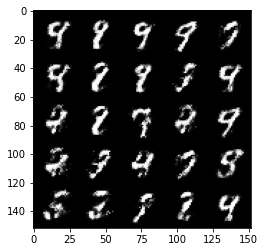

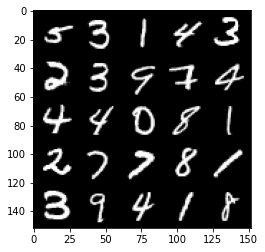

Step 28000: Generator loss: 2.828450438022611, discriminator loss: 0.20855132514238367


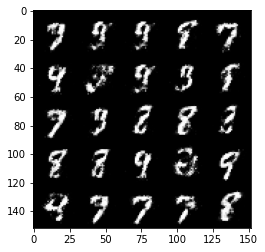

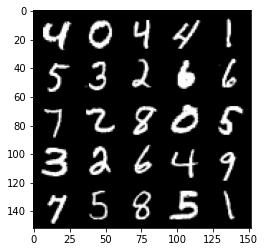

Step 28500: Generator loss: 2.6835436673164366, discriminator loss: 0.2035504329949619


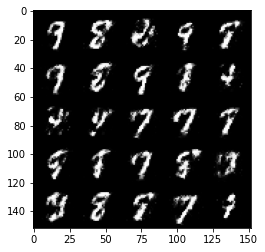

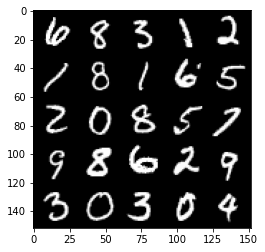

Step 29000: Generator loss: 2.829511793613434, discriminator loss: 0.19959459553658945


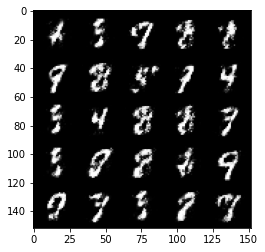

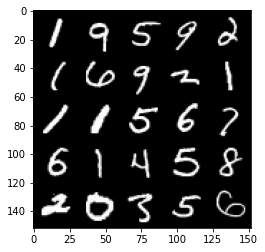

Step 29500: Generator loss: 2.745901504516602, discriminator loss: 0.22568438935279844


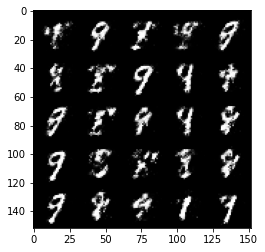

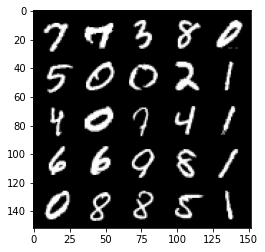

Step 30000: Generator loss: 2.73130550670624, discriminator loss: 0.2271257100999358


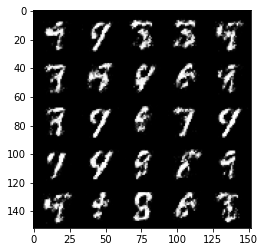

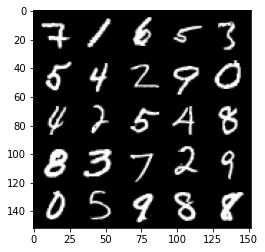

Step 30500: Generator loss: 2.6352616753578175, discriminator loss: 0.2244248517155647


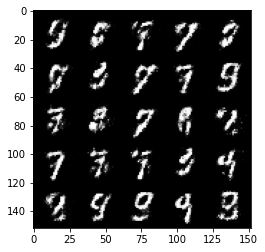

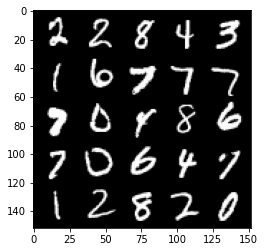

Step 31000: Generator loss: 2.5437646846771256, discriminator loss: 0.24138131168484692


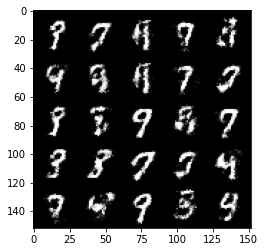

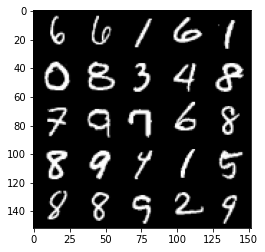

Step 31500: Generator loss: 2.506303756713868, discriminator loss: 0.25283275789022436


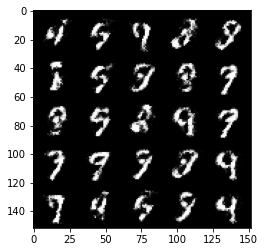

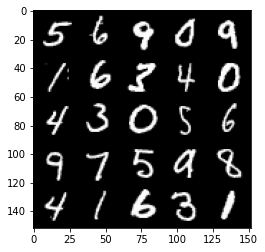

Step 32000: Generator loss: 2.3634077460765823, discriminator loss: 0.2630585629642008


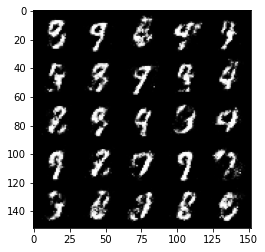

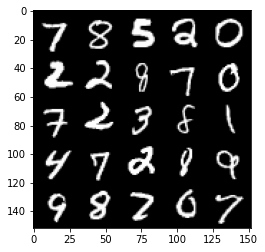

Step 32500: Generator loss: 2.5460849719047522, discriminator loss: 0.2373431101441382


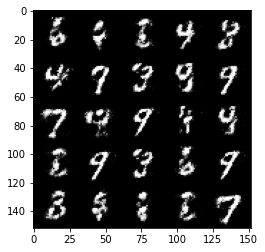

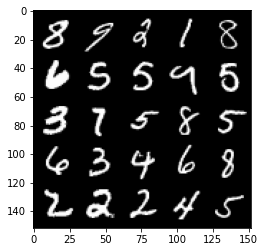

Step 33000: Generator loss: 2.431285078287128, discriminator loss: 0.2580644249618054


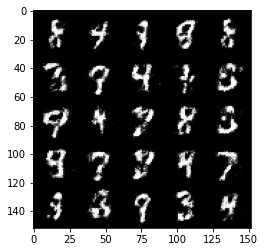

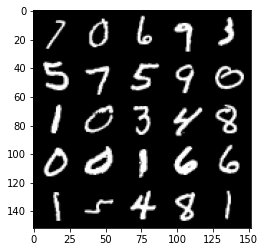

Step 33500: Generator loss: 2.430990597724915, discriminator loss: 0.2631289952993393


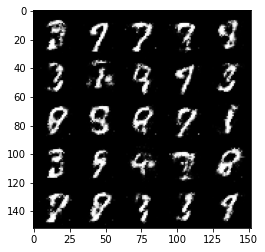

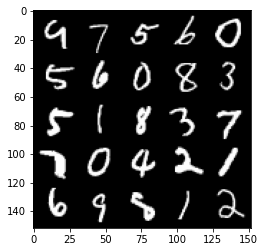

Step 34000: Generator loss: 2.3479232125282303, discriminator loss: 0.2720494625568391


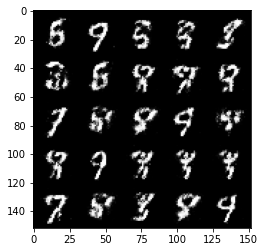

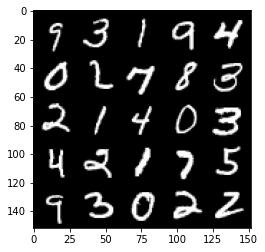

Step 34500: Generator loss: 2.4814024701118487, discriminator loss: 0.23870842891931515


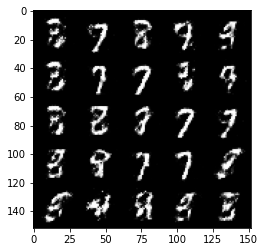

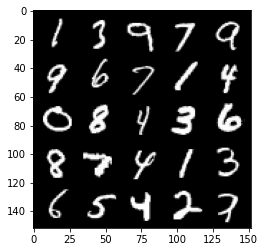

Step 35000: Generator loss: 2.4940746371746076, discriminator loss: 0.2509994173943997


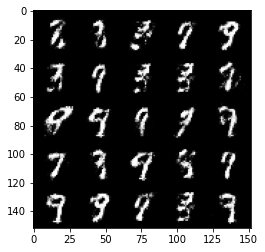

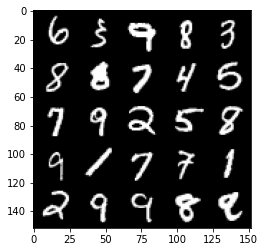

Step 35500: Generator loss: 2.385722939968109, discriminator loss: 0.2600538778305053


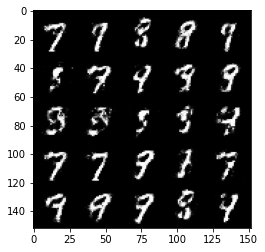

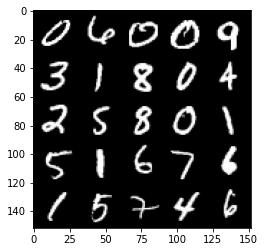

Step 36000: Generator loss: 2.36232097840309, discriminator loss: 0.25847187864780413


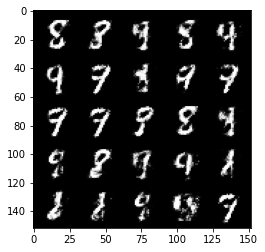

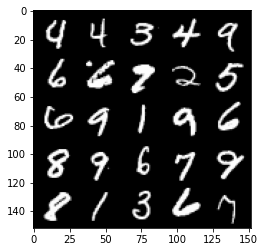

Step 36500: Generator loss: 2.3693287036418913, discriminator loss: 0.257476390570402


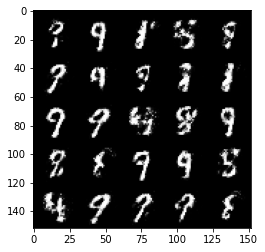

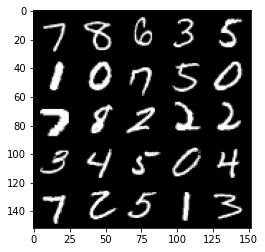

Step 37000: Generator loss: 2.341898062705994, discriminator loss: 0.2659152894318101


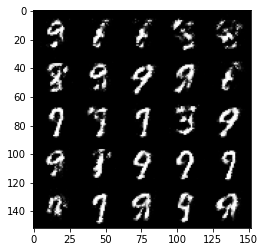

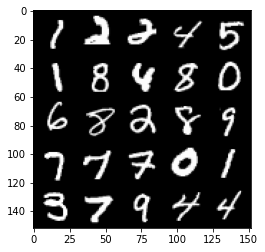

Step 37500: Generator loss: 2.5657861452102653, discriminator loss: 0.23042822656035436


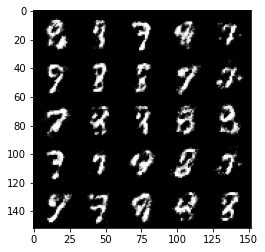

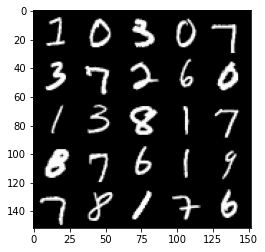

Step 38000: Generator loss: 2.286115018844601, discriminator loss: 0.27910729962587344


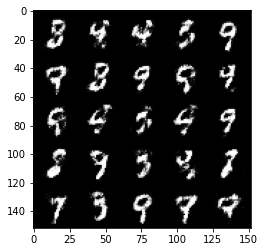

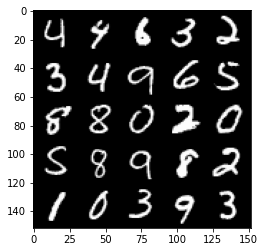

Step 38500: Generator loss: 2.3530410139560693, discriminator loss: 0.2551514314711092


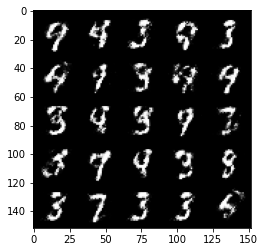

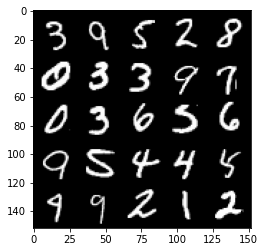

Step 39000: Generator loss: 2.33181969285011, discriminator loss: 0.27246198567748076


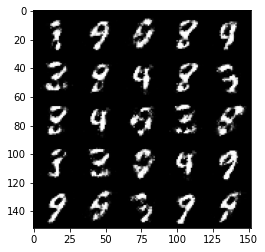

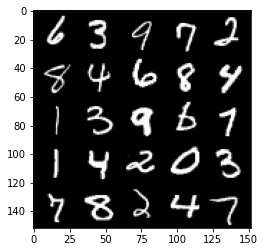

Step 39500: Generator loss: 2.2328148386478426, discriminator loss: 0.2791161759197712


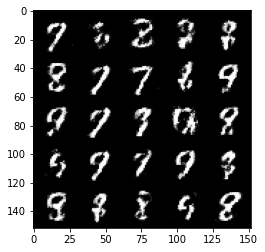

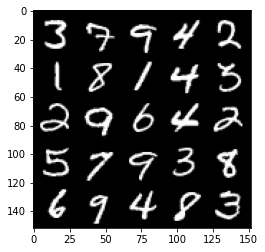

Step 40000: Generator loss: 2.145027895212175, discriminator loss: 0.29692146244645123


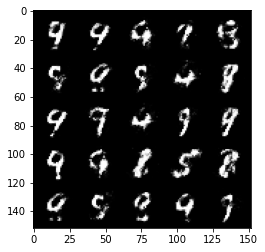

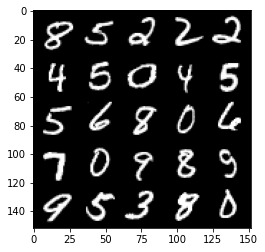

Step 40500: Generator loss: 2.2655328550338742, discriminator loss: 0.27524437826871845


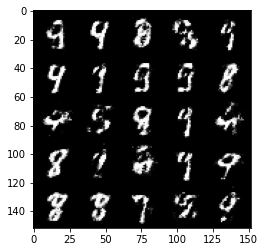

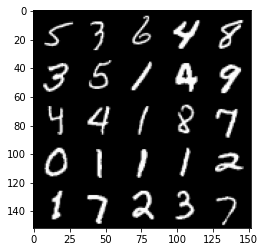

Step 41000: Generator loss: 2.2916014547348005, discriminator loss: 0.2720135493874551


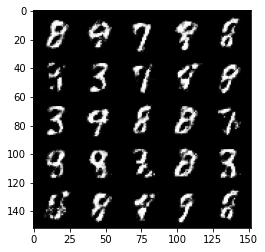

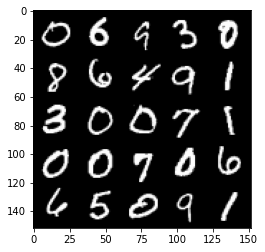

Step 41500: Generator loss: 2.1075385642051714, discriminator loss: 0.3165628881752493


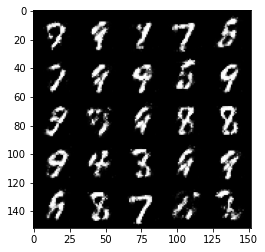

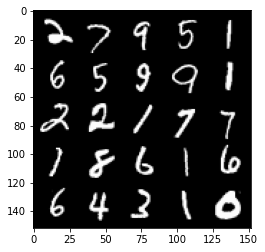

Step 42000: Generator loss: 2.103934962749484, discriminator loss: 0.29992924538254756


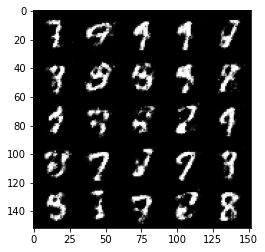

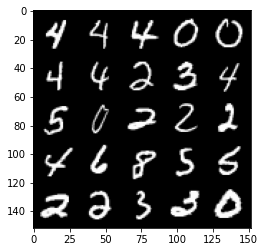

Step 42500: Generator loss: 2.1321499752998343, discriminator loss: 0.3057108053266999


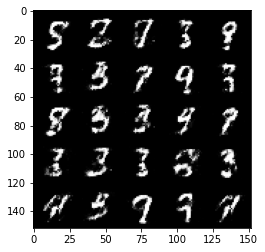

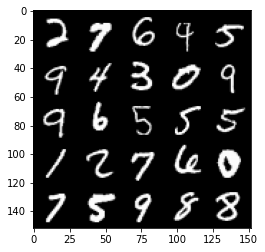

Step 43000: Generator loss: 2.1133051984310156, discriminator loss: 0.290419146895409


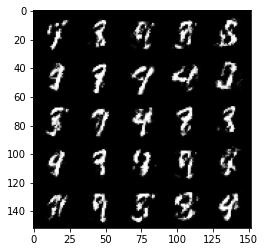

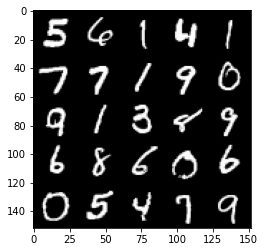

Step 43500: Generator loss: 2.188014395713806, discriminator loss: 0.28408662632107745


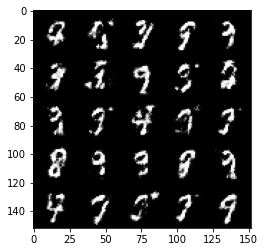

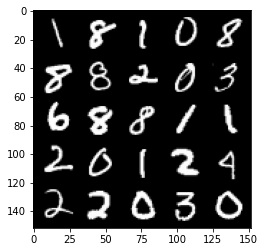

Step 44000: Generator loss: 2.1103830313682557, discriminator loss: 0.3093712643384933


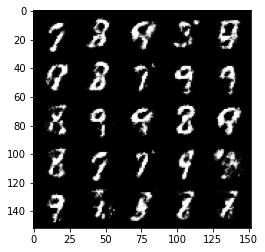

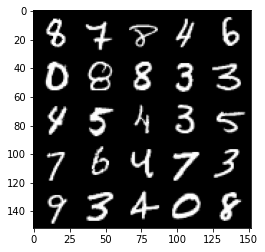

Step 44500: Generator loss: 2.0375024411678315, discriminator loss: 0.3095606155395508


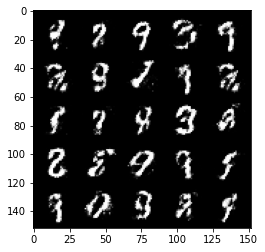

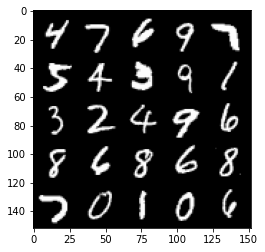

Step 45000: Generator loss: 2.0549982128143323, discriminator loss: 0.3276064686775204


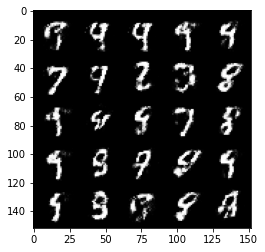

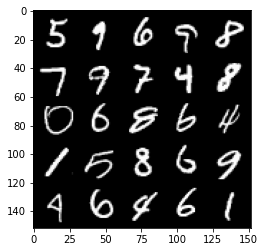

Step 45500: Generator loss: 1.9264996144771585, discriminator loss: 0.33093613138794903


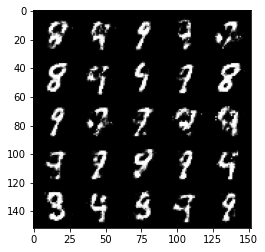

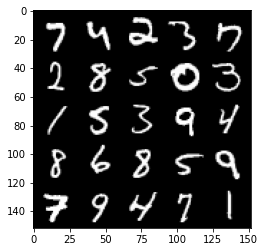

Step 46000: Generator loss: 2.045699842214585, discriminator loss: 0.30663413944840434


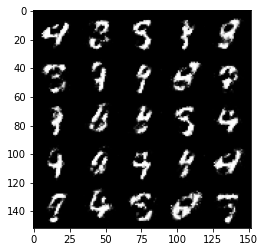

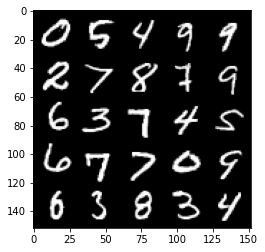

Step 46500: Generator loss: 2.0533604152202605, discriminator loss: 0.3060045287311077


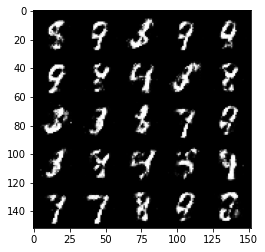

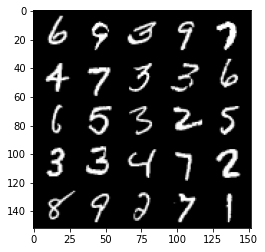

Step 47000: Generator loss: 2.003286149024964, discriminator loss: 0.32316134655475665


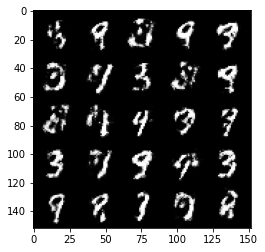

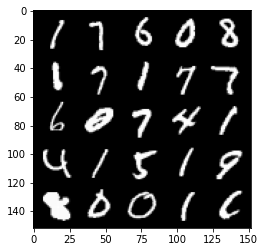

Step 47500: Generator loss: 2.0154364545345294, discriminator loss: 0.3190890960395335


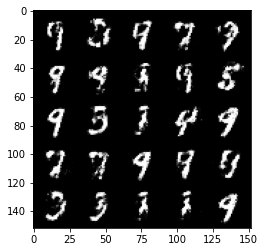

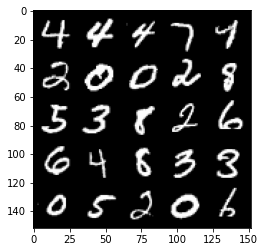

Step 48000: Generator loss: 1.9862437062263478, discriminator loss: 0.3216378629505638


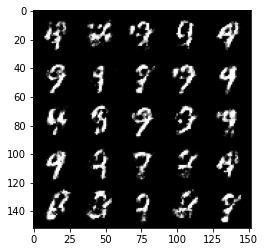

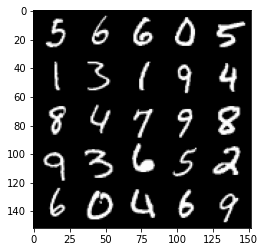

Step 48500: Generator loss: 1.9173312587738054, discriminator loss: 0.32947283270955063


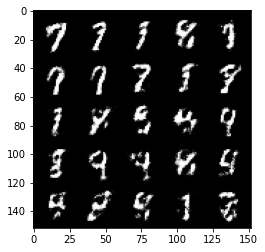

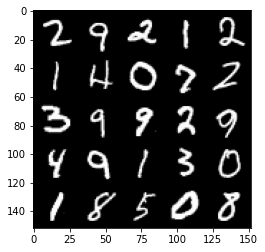

Step 49000: Generator loss: 1.9449684972763057, discriminator loss: 0.3402185834944249


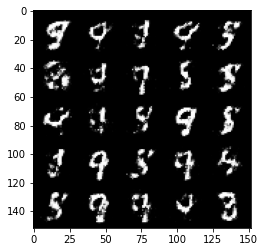

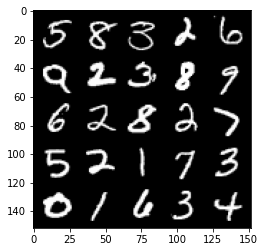

Step 49500: Generator loss: 1.9336129326820362, discriminator loss: 0.322546148121357


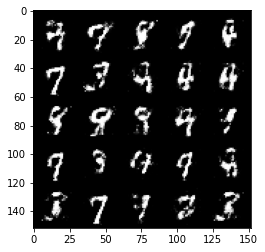

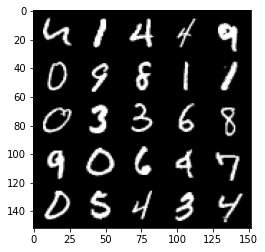

Step 50000: Generator loss: 2.018095005273818, discriminator loss: 0.32540384551882706


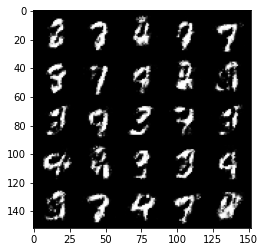

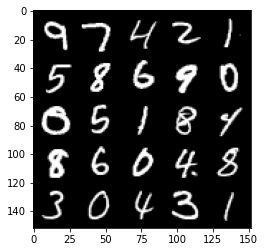

Step 50500: Generator loss: 1.9432076909542082, discriminator loss: 0.3253317164480683


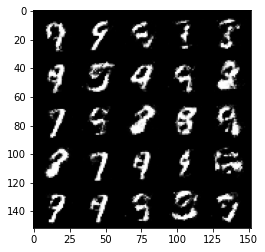

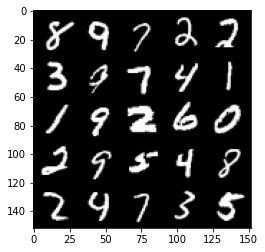

Step 51000: Generator loss: 1.833982256889345, discriminator loss: 0.3513597378730774


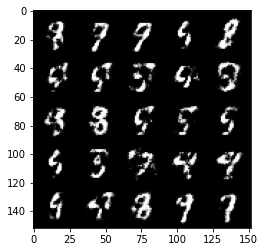

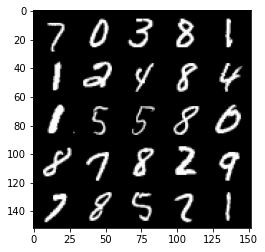

Step 51500: Generator loss: 1.8671384680271144, discriminator loss: 0.34084327292442285


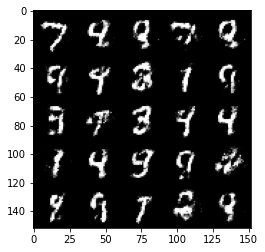

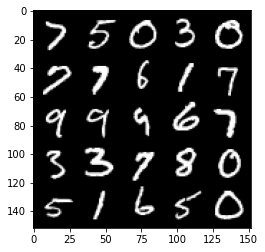

Step 52000: Generator loss: 1.8766601388454438, discriminator loss: 0.3412263321280481


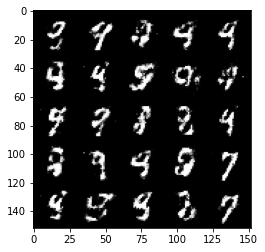

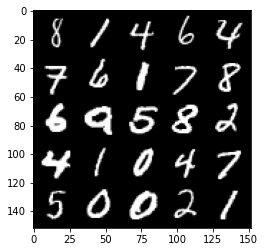

Step 52500: Generator loss: 1.9040828416347486, discriminator loss: 0.34322645395994156


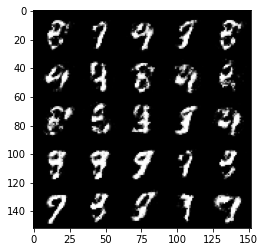

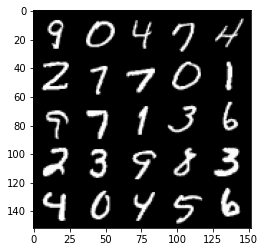

Step 53000: Generator loss: 1.8002741317749023, discriminator loss: 0.36535478657484055


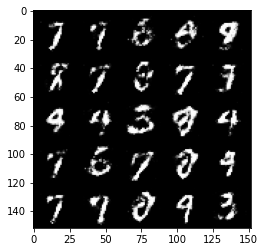

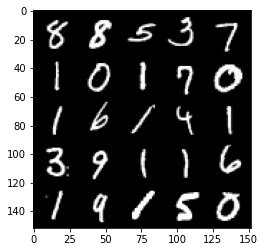

Step 53500: Generator loss: 1.7075779736042023, discriminator loss: 0.3704410710930824


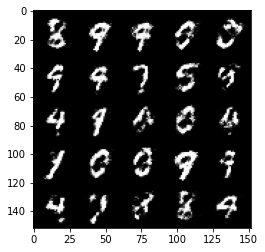

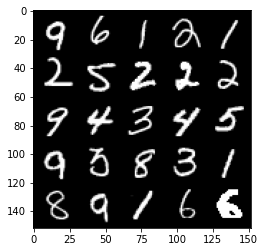

Step 54000: Generator loss: 1.8298436830043803, discriminator loss: 0.3491518321931363


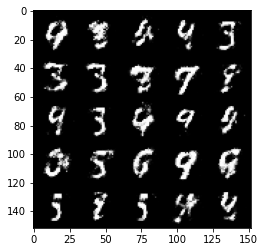

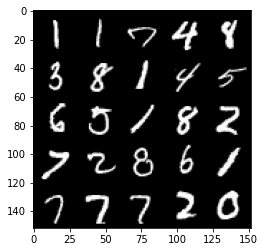

Step 54500: Generator loss: 1.7665304622650142, discriminator loss: 0.3638813108801842


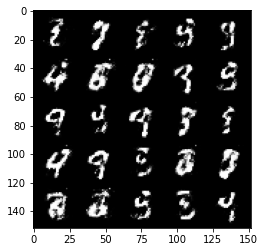

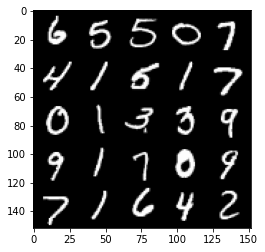

Step 55000: Generator loss: 1.7702774159908308, discriminator loss: 0.360111461222172


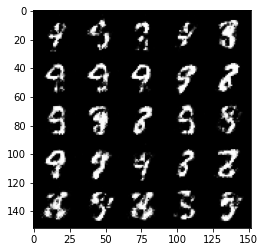

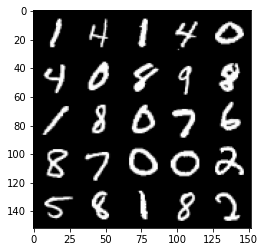

Step 55500: Generator loss: 1.8511847035884856, discriminator loss: 0.3449441002309323


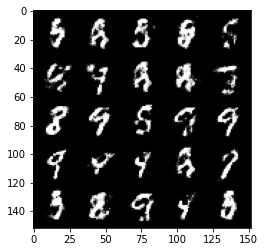

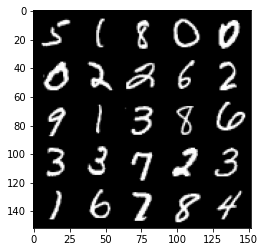

Step 56000: Generator loss: 1.8011879763603194, discriminator loss: 0.348337476551533


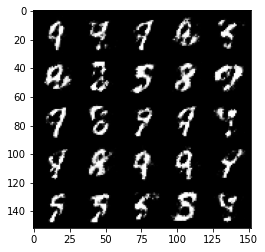

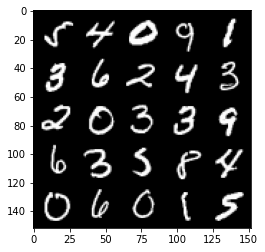

Step 56500: Generator loss: 1.859093732118607, discriminator loss: 0.3426512160897251


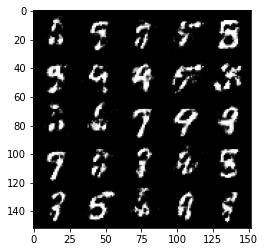

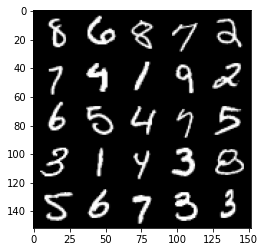

Step 57000: Generator loss: 1.7032752492427825, discriminator loss: 0.3755286934971804


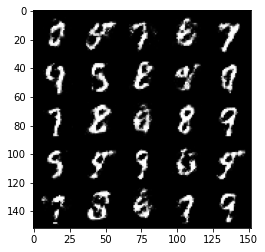

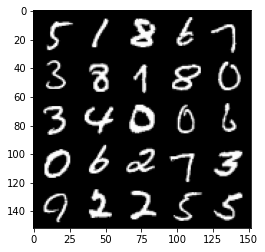

Step 57500: Generator loss: 1.7476335420608513, discriminator loss: 0.37639659297466266


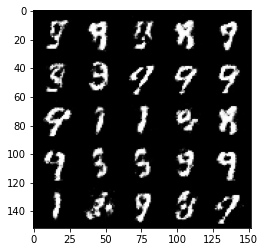

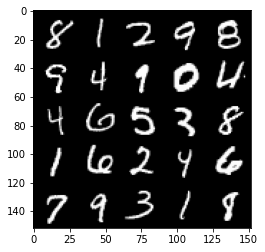

Step 58000: Generator loss: 1.7168838181495665, discriminator loss: 0.3779759249091149


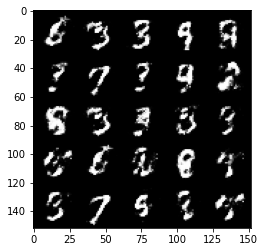

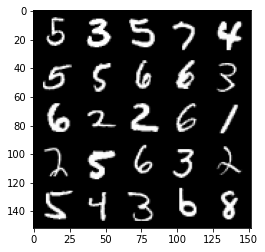

Step 58500: Generator loss: 1.7260717577934257, discriminator loss: 0.36373727101087555


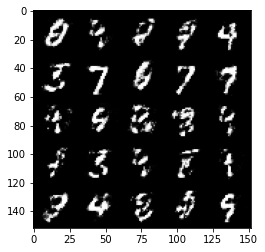

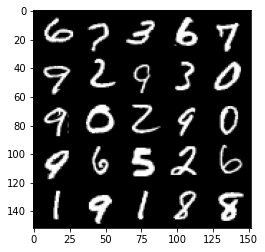

Step 59000: Generator loss: 1.7543989813327798, discriminator loss: 0.3616059894859791


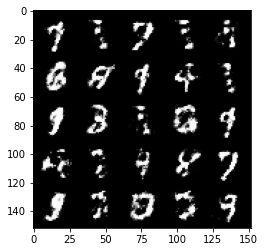

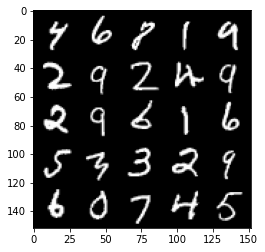

Step 59500: Generator loss: 1.6899230754375467, discriminator loss: 0.38114130753278747


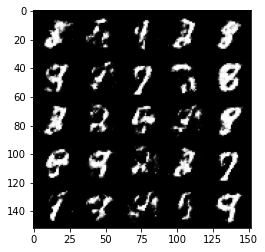

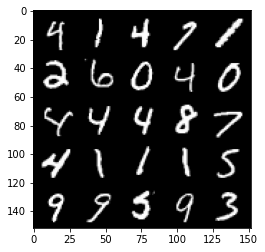

Step 60000: Generator loss: 1.686512223243713, discriminator loss: 0.37475590360164607


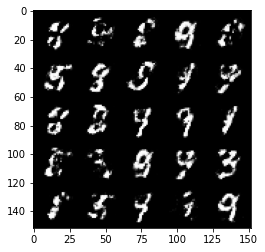

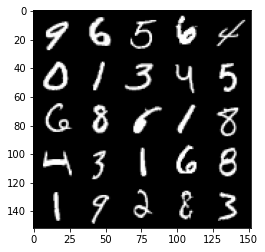

Step 60500: Generator loss: 1.6553641784191135, discriminator loss: 0.39089575552940403


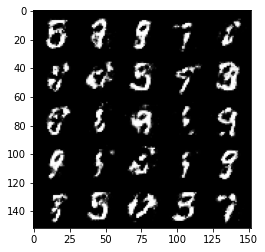

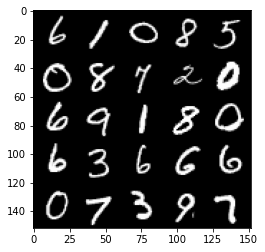

Step 61000: Generator loss: 1.7025335686206824, discriminator loss: 0.37680531626939745


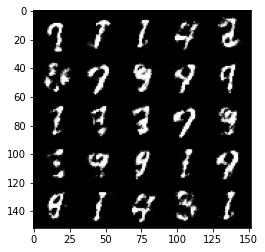

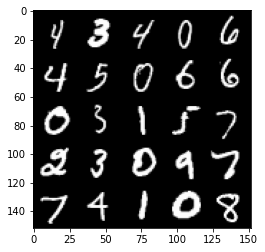

Step 61500: Generator loss: 1.6965603902339923, discriminator loss: 0.37571433258056625


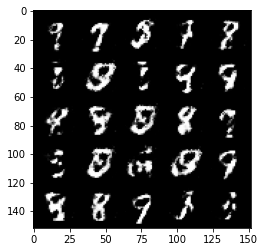

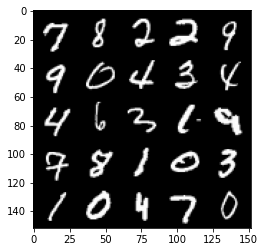

Step 62000: Generator loss: 1.772023833751678, discriminator loss: 0.3491378553211692


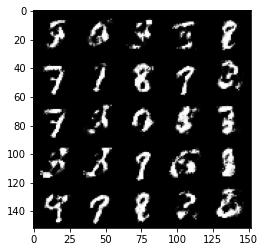

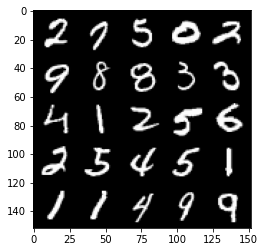

Step 62500: Generator loss: 1.7441288061141969, discriminator loss: 0.37481120949983615


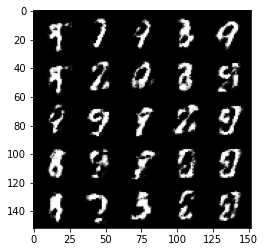

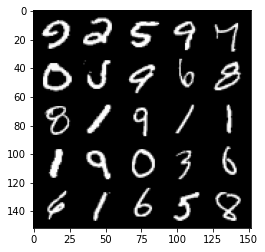

Step 63000: Generator loss: 1.7515659341812122, discriminator loss: 0.3714060000777245


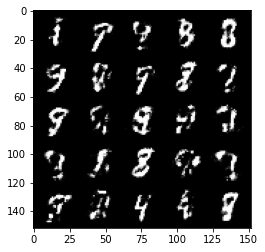

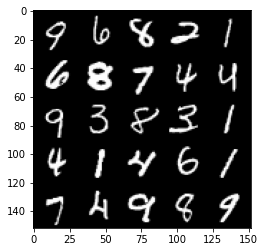

Step 63500: Generator loss: 1.601042709827424, discriminator loss: 0.397048228859901


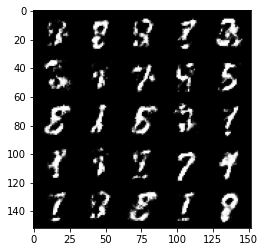

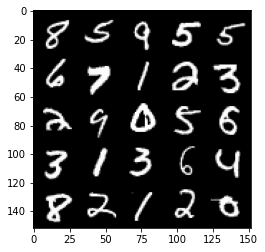

Step 64000: Generator loss: 1.6273572068214393, discriminator loss: 0.39746290415525465


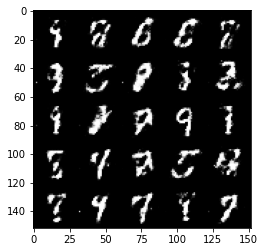

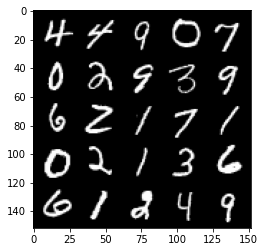

Step 64500: Generator loss: 1.5399090769290926, discriminator loss: 0.41570209133625047


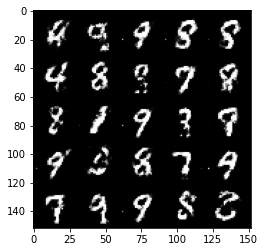

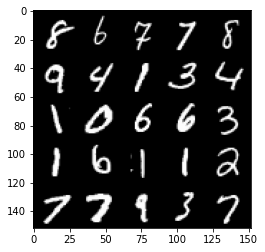

Step 65000: Generator loss: 1.6325585064887984, discriminator loss: 0.40623097437620126


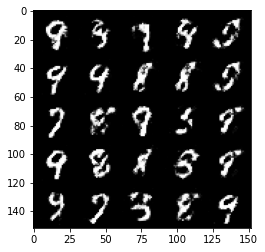

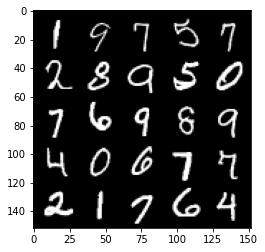

Step 65500: Generator loss: 1.615311187267305, discriminator loss: 0.3968117516636847


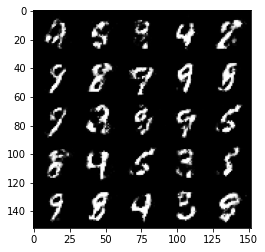

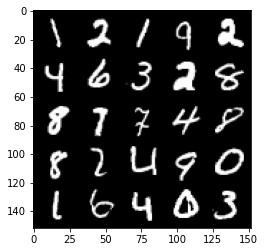

Step 66000: Generator loss: 1.65873171710968, discriminator loss: 0.3768286585211761


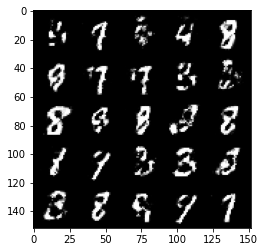

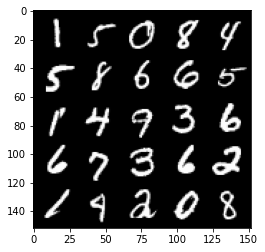

Step 66500: Generator loss: 1.6989301786422761, discriminator loss: 0.3654303881824014


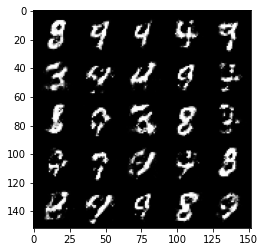

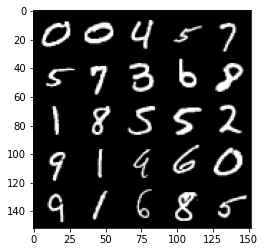

Step 67000: Generator loss: 1.5777865712642674, discriminator loss: 0.39077916038036375


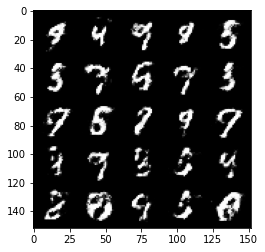

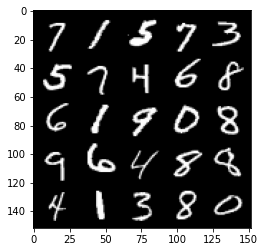

Step 67500: Generator loss: 1.6517745709419251, discriminator loss: 0.3827727978229524


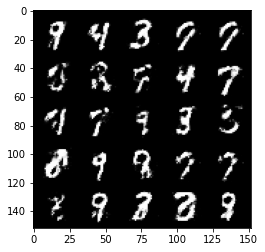

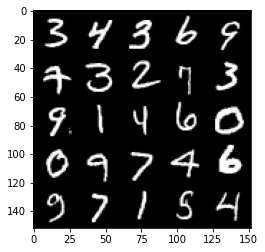

Step 68000: Generator loss: 1.663445698022842, discriminator loss: 0.3773118550181389


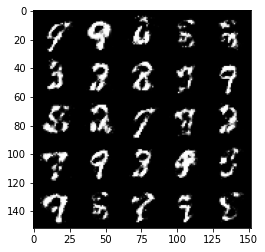

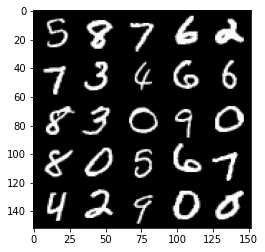

Step 68500: Generator loss: 1.626338144302367, discriminator loss: 0.39386120969057137


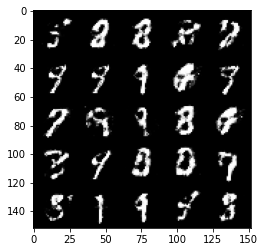

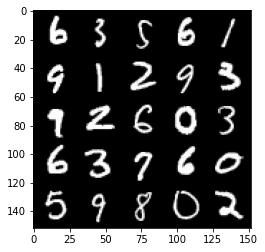

Step 69000: Generator loss: 1.546853447675704, discriminator loss: 0.4100284969806669


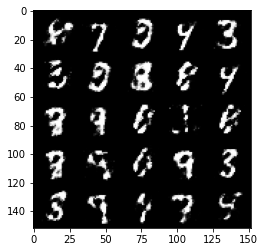

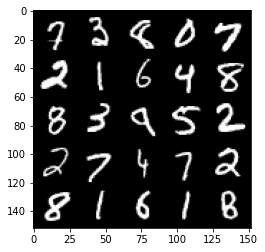

Step 69500: Generator loss: 1.470899579524993, discriminator loss: 0.43192205804586414


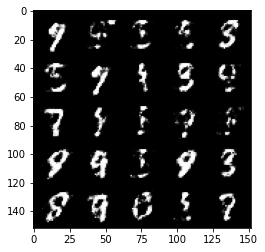

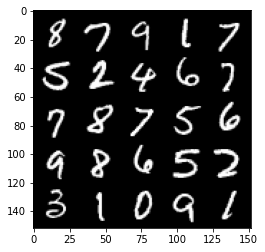

Step 70000: Generator loss: 1.479165751218795, discriminator loss: 0.4130757302641874


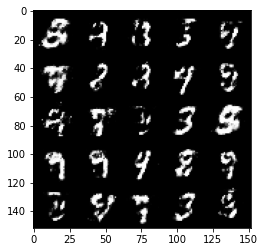

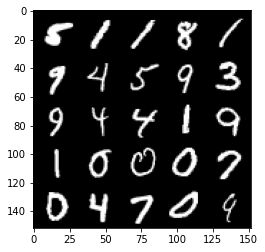

Step 70500: Generator loss: 1.6104272878170016, discriminator loss: 0.38191931414604224


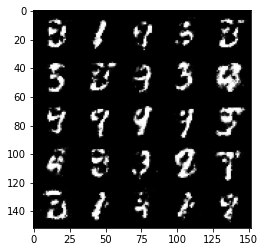

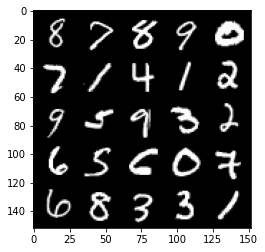

Step 71000: Generator loss: 1.5343850674629207, discriminator loss: 0.4285023996829984


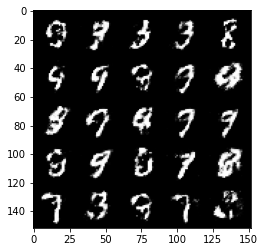

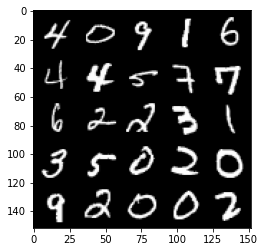

Step 71500: Generator loss: 1.5825311517715455, discriminator loss: 0.3942349591851235


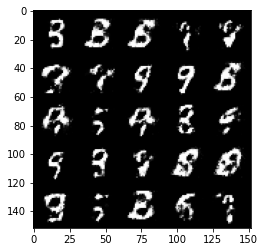

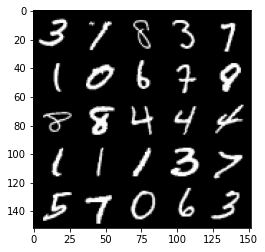

Step 72000: Generator loss: 1.6897775201797482, discriminator loss: 0.380485164046288


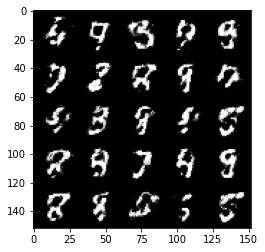

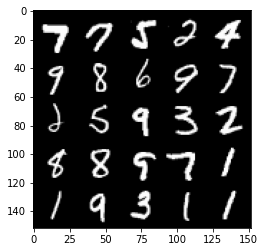

Step 72500: Generator loss: 1.5705529212951679, discriminator loss: 0.4137281653285027


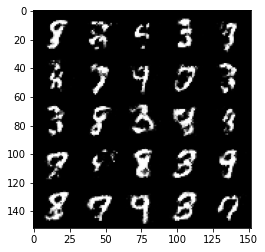

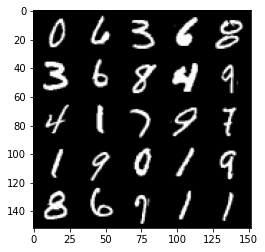

Step 73000: Generator loss: 1.506358503103257, discriminator loss: 0.4124020947813991


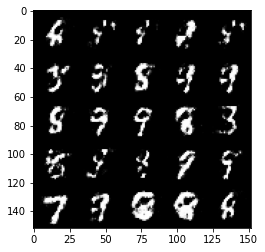

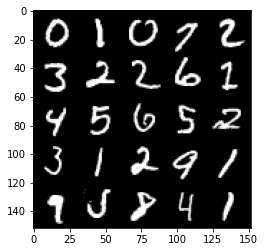

Step 73500: Generator loss: 1.5785042114257821, discriminator loss: 0.3932286832928666


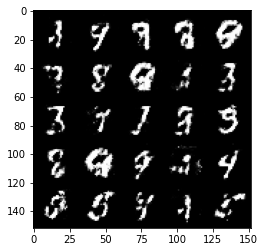

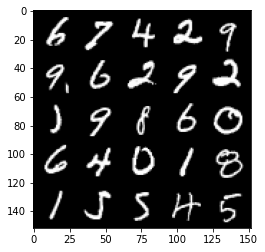

Step 74000: Generator loss: 1.6099058034420022, discriminator loss: 0.39182172405719745


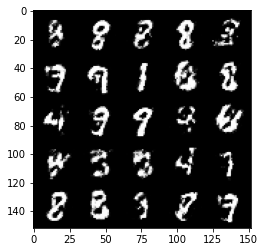

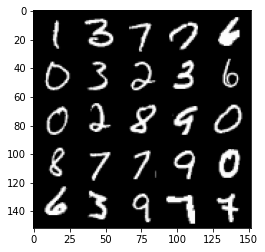

Step 74500: Generator loss: 1.552494206666947, discriminator loss: 0.4081412998437884


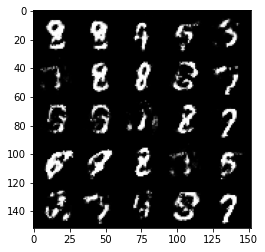

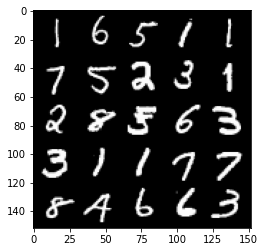

Step 75000: Generator loss: 1.5066193661689757, discriminator loss: 0.41730462825298353


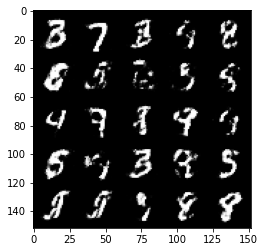

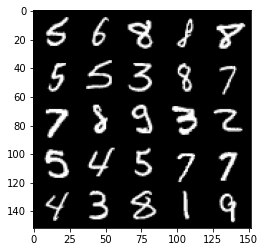

Step 75500: Generator loss: 1.5046647357940677, discriminator loss: 0.41056848222017245


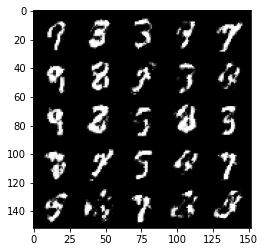

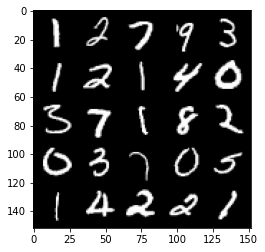

Step 76000: Generator loss: 1.5608116295337682, discriminator loss: 0.4066897820234302


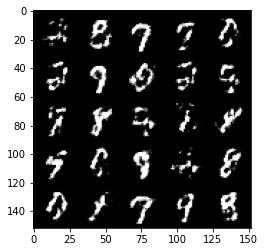

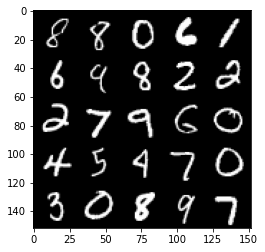

Step 76500: Generator loss: 1.4706525552272796, discriminator loss: 0.4386131714582445


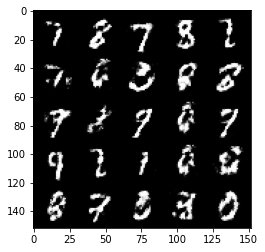

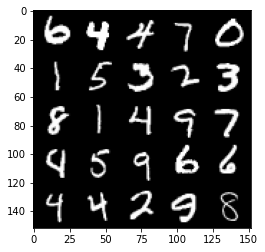

Step 77000: Generator loss: 1.4054239568710332, discriminator loss: 0.45858026337623636


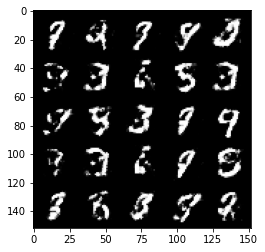

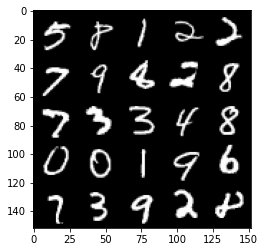

Step 77500: Generator loss: 1.549269982337951, discriminator loss: 0.40579194456338846


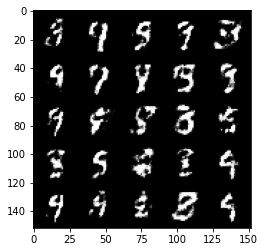

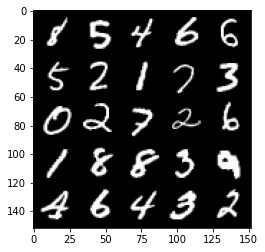

Step 78000: Generator loss: 1.493685165882111, discriminator loss: 0.42042342060804316


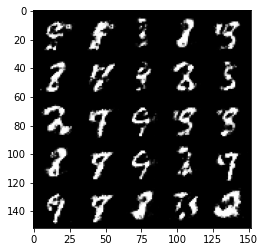

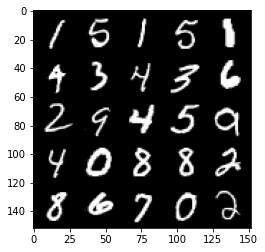

Step 78500: Generator loss: 1.5103175945282, discriminator loss: 0.408910197675228


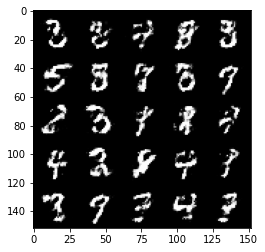

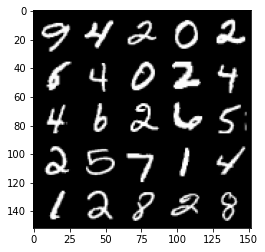

Step 79000: Generator loss: 1.4696531147956835, discriminator loss: 0.42227740585803947


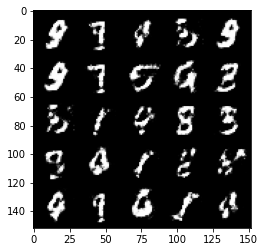

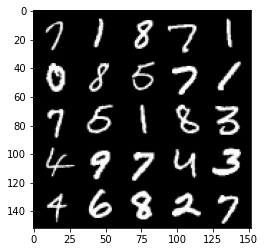

Step 79500: Generator loss: 1.4806146659851067, discriminator loss: 0.40842990279197716


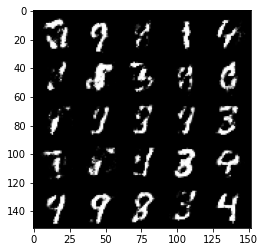

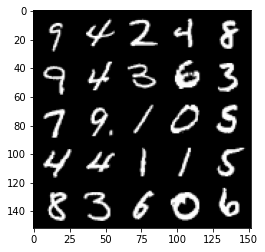

Step 80000: Generator loss: 1.4333288626670841, discriminator loss: 0.43572110831737554


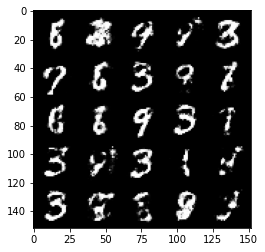

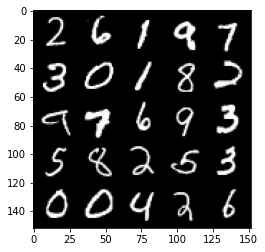

Step 80500: Generator loss: 1.392594136714936, discriminator loss: 0.4420138815641404


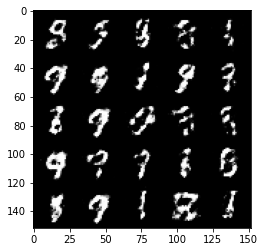

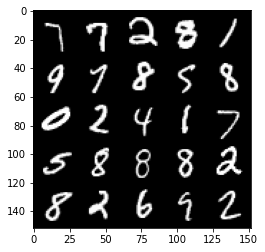

Step 81000: Generator loss: 1.4241495842933645, discriminator loss: 0.43458781415224096


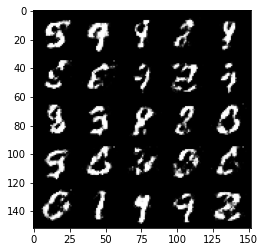

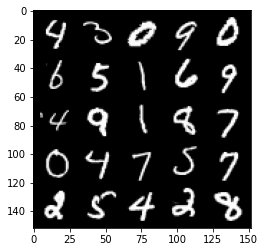

Step 81500: Generator loss: 1.4208272662162786, discriminator loss: 0.4372014217376712


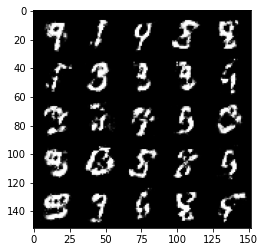

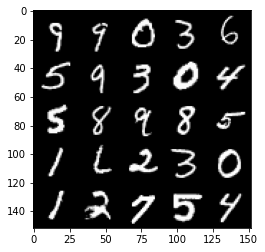

Step 82000: Generator loss: 1.462850113868715, discriminator loss: 0.4262380773425105


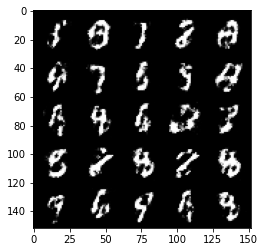

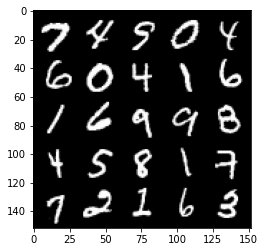

Step 82500: Generator loss: 1.4455653486251838, discriminator loss: 0.44209607464075024


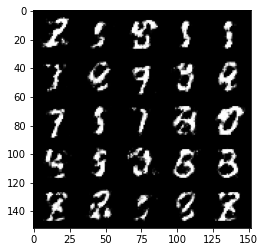

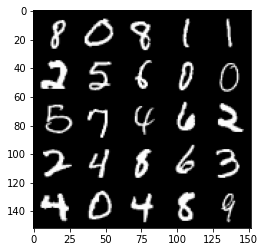

Step 83000: Generator loss: 1.476400695562363, discriminator loss: 0.41837861275672944


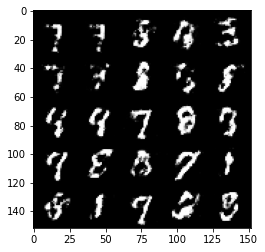

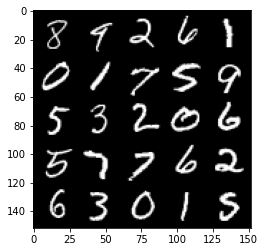

Step 83500: Generator loss: 1.4904533481597912, discriminator loss: 0.41135463058948535


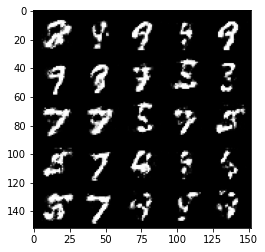

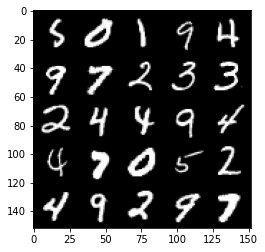

Step 84000: Generator loss: 1.5177682454586028, discriminator loss: 0.3985452629923818


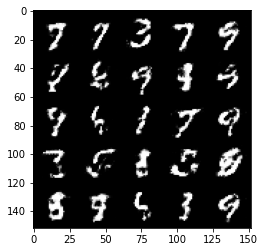

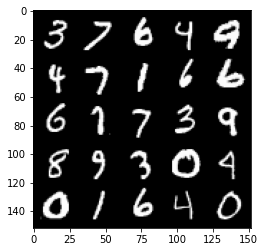

Step 84500: Generator loss: 1.5303699059486389, discriminator loss: 0.40662231445312474


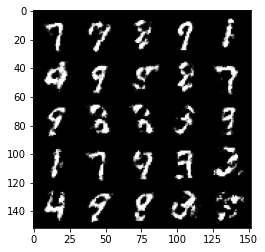

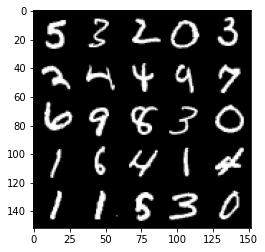

Step 85000: Generator loss: 1.4297948815822605, discriminator loss: 0.43607421767711646


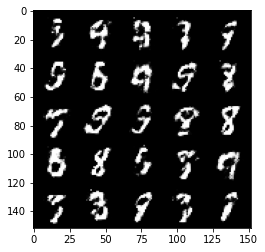

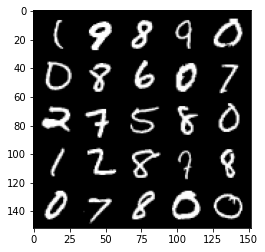

Step 85500: Generator loss: 1.4614951057434082, discriminator loss: 0.42375422257184997


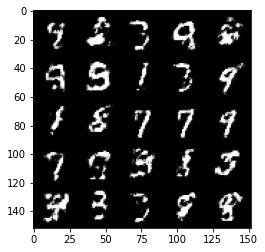

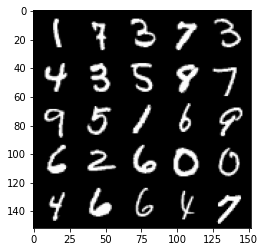

Step 86000: Generator loss: 1.3973836348056785, discriminator loss: 0.4372304844856261


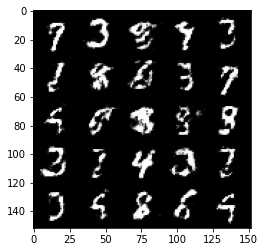

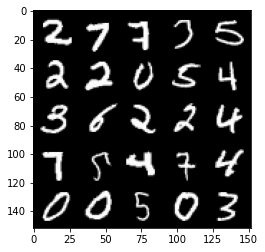

Step 86500: Generator loss: 1.4195950391292578, discriminator loss: 0.4336003528237342


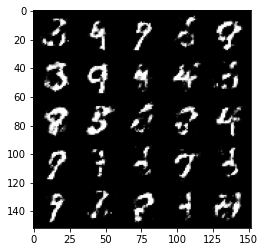

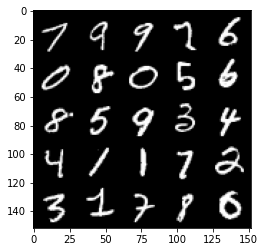

Step 87000: Generator loss: 1.468038555145264, discriminator loss: 0.42249478185176875


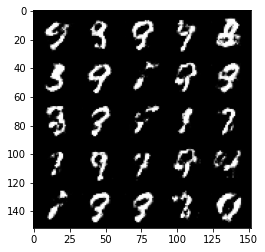

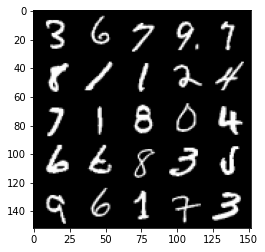

Step 87500: Generator loss: 1.4127197349071512, discriminator loss: 0.4483958083391191


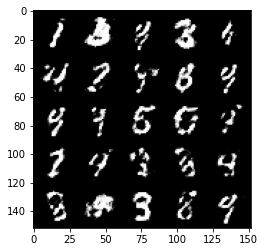

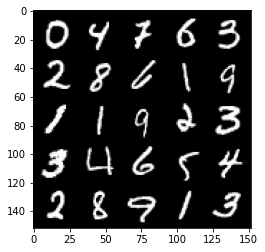

Step 88000: Generator loss: 1.3828495543003072, discriminator loss: 0.4323872316479681


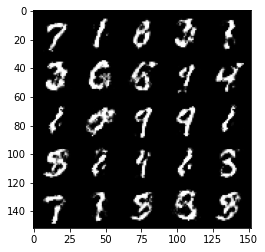

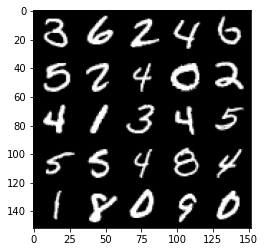

Step 88500: Generator loss: 1.4314314546585087, discriminator loss: 0.4312904181480408


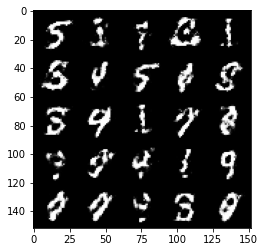

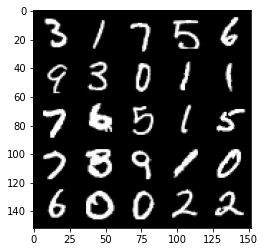

Step 89000: Generator loss: 1.4776168889999384, discriminator loss: 0.4377703391909599


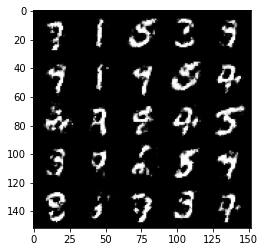

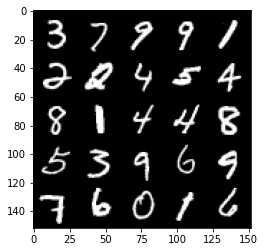

Step 89500: Generator loss: 1.384421288251877, discriminator loss: 0.45156009942293146


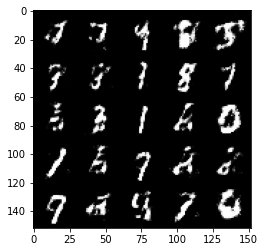

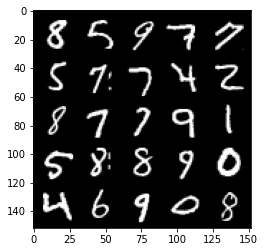

Step 90000: Generator loss: 1.4082029786109906, discriminator loss: 0.4408891000747681


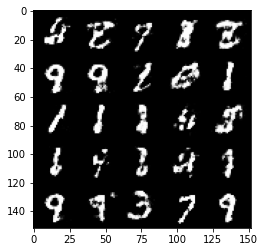

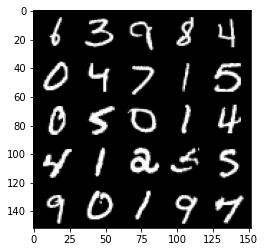

Step 90500: Generator loss: 1.4176392107009899, discriminator loss: 0.43796607655286773


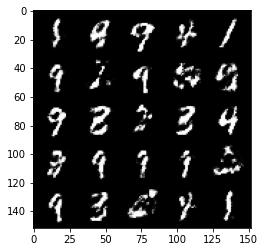

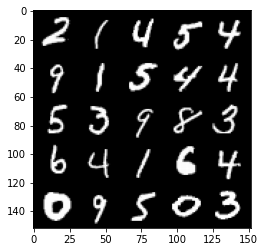

Step 91000: Generator loss: 1.363196799993515, discriminator loss: 0.45673916220665


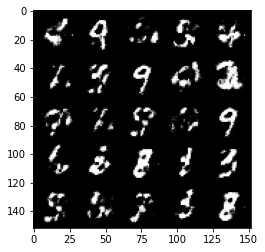

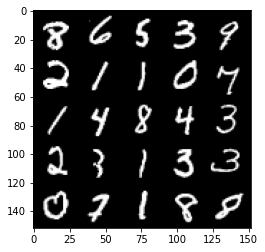

Step 91500: Generator loss: 1.3789331560134883, discriminator loss: 0.44572260904312133


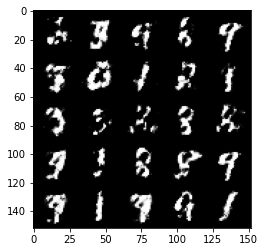

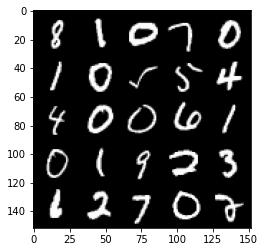

Step 92000: Generator loss: 1.3172940902709964, discriminator loss: 0.4584345269203189


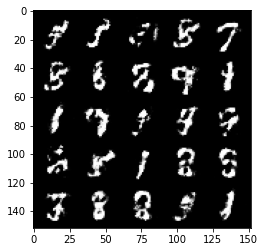

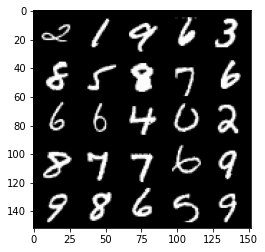

Step 92500: Generator loss: 1.2986383471488958, discriminator loss: 0.48338845801353514


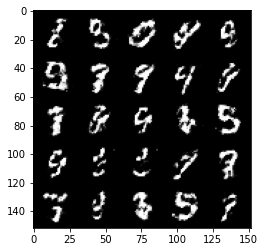

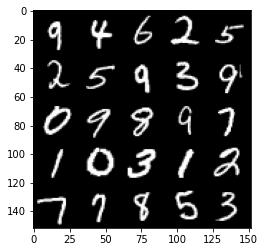

Step 93000: Generator loss: 1.2855790112018581, discriminator loss: 0.4709841435551638


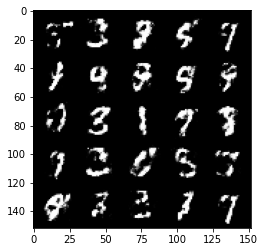

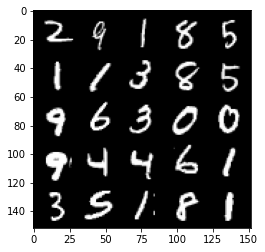

Step 93500: Generator loss: 1.268354880094529, discriminator loss: 0.48252452623844116


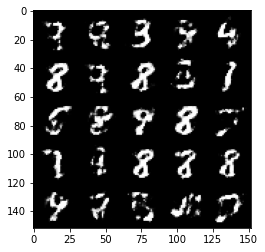

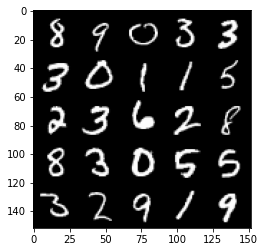

In [109]:
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        
        real = real.view(cur_batch_size, -1).to(device)

        
        disc_opt.zero_grad()
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        disc_loss.backward(retain_graph=True)
        disc_opt.step()
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        mean_discriminator_loss += disc_loss.item() / display_step

        mean_generator_loss += gen_loss.item() / display_step

        
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device = device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1